
# **Vehicle and Pedestrian Detection**

**In this lesson we'll learn:**
1. Use a Haarcascade classier to detect Pedestrians
2. Use our Haarcascade classifiers on videos
3. Use a Haarcascade classier to detect Vehicles or cars


In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def imshow(image, title = "", size = 10):
    w, h = image.shape[:2]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)



#### **Testing on a Single Frame from our Video**

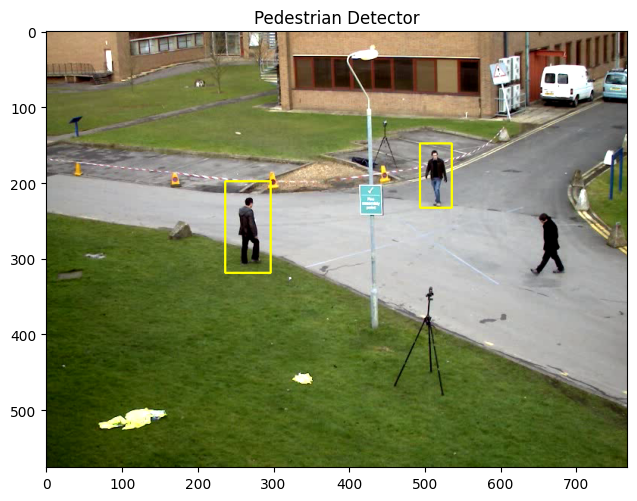

In [142]:
# Create our video capturing object
cap= cv2.VideoCapture('videos/walking_full.avi')

# Load our body classifier
body_classifier= cv2.CascadeClassifier('haar_cascades/haarcascade_fullbody.xml')

# Read first frame
status, frame= cap.read()

# Status is True if successfully read
if status:
    #Grayscale our image for faster processing
    gray= cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Pass frame to our body classifier
    bodies= body_classifier.detectMultiScale(gray, 1.2, 2)
    
    # Extract bounding boxes for any bodies identified
    for x,y,w,h in bodies:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,255), 2)
        
# Release our video capture
cap.release()
imshow(frame, 'Pedestrian Detector')

In [67]:
type(cap)

cv2.VideoCapture

In [68]:
cap.get(3), cap.get(4)

(0.0, 0.0)

In [69]:
status

True

In [70]:
frame.shape

(576, 768, 3)

#### **Testing on our 15 second clip**

**NOTE**: Takes around 1 minute to run.

We use cv2.VideoWriter to save the output as an AVI file.

```cv2.VideoWriter(video_output.avi, cv2.VideoWriter_fourcc('M','J','P','G'), FPS, (width, height))```

Formats can be:
- 'M','J','P','G' or MJPG
- MP4V
- X264
- avc1
- XVID



In [143]:
# Create our video capturing object
cap= cv2.VideoCapture('videos/walking_full.avi')
body_detector= cv2.CascadeClassifier('haar_cascades/haarcascade_fullbody.xml')

# Get the height and width of the frame (required to be an interfer)
w= int(cap.get(3))
h= int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'walking_output.avi' file.
out= cv2.VideoWriter('videos/walking_output.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 10, (w, h))

# Loop once video is successfully loaded
while(True):
    ret, frame= cap.read()
    if ret:
        gray= cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Pass frame to our body classifier
        bodies= body_detector.detectMultiScale(gray, 1.2, 2)
        
        # Extract bounding boxes for any bodies identified
        for x,y,w,h in bodies:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
            
        # Write the frame into the file 'output.avi'
        out.write(frame)
    else:
        break
        
cap.release()
out.release()

In [144]:
w, h

(np.int32(52), np.int32(103))

## **Play Video within NoteBook**
Steps
1. Convert the AVI file to MP4 using FFMPEG
2. Load the HTML plugins in IPython
3. Display our HTML video player

In [145]:
!ffmpeg -i videos/walking_output.avi videos/walking_output.mp4 -y

ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

In [146]:
from IPython.display import HTML
from base64 import b64encode

mp4= open('videos/walking_output.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [147]:
type(mp4)

bytes

In [148]:
len(b64encode(mp4)), type(b64encode(mp4))

(9668340, bytes)

In [149]:
len(data_url), type(data_url)

(9668362, str)

In [150]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#### **Vehicle Detection on Single Image**

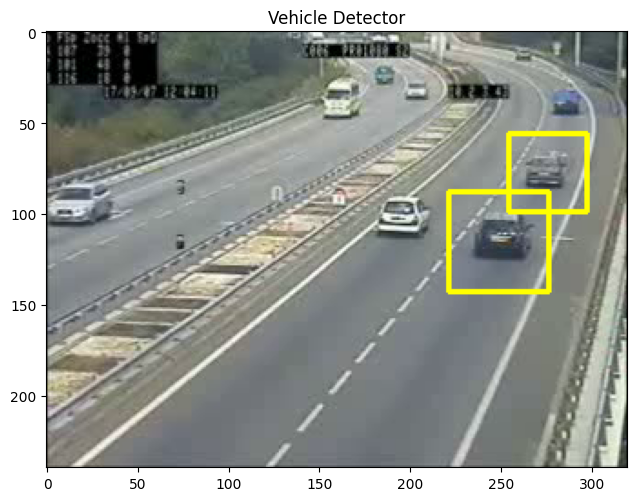

In [131]:
# Create our video capturing object
cap= cv2.VideoCapture('videos/cars.avi')

# Load our vehicle classifier
vehicle_detector= cv2.CascadeClassifier('haar_cascades/cars.xml')

# Read first frame
ret, frame= cap.read()

if ret:
    gray= cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Pass frame to our body classifier
    vehicles= vehicle_detector.detectMultiScale(gray, 1.2, 2)
    
    # Extract bounding boxes for any bodies identified
    for x,y,w,h in vehicles:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,255), 2)
        
# Release our video capture
cap.release()
imshow(frame, 'Vehicle Detector')

#### **Testing on our 15 second clip**

In [141]:
# Create our video capturing object
cap= cv2.VideoCapture('videos/cars.avi')
vehicle_detector= cv2.CascadeClassifier('haar_cascades/cars.xml')

# Get the height and width of the frame (required to be an interfer)
w, h= int(cap.get(3)), int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out= cv2.VideoWriter('videos/cars_output.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 25, (w, h))

# Loop once video is successfully loaded
while(True):
    ret, frame= cap.read()
    if ret:
        gray= cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        vehicles= vehicle_detector.detectMultiScale(gray, 1.2, 2)
        for x,y,w,h in vehicles:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,255), 2)
            
        out.write(frame)
    else:
        break
        
cap.release()
out.release()

In [155]:
!ffmpeg -i videos/cars_output.avi videos/cars_output.mp4 -y

ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

In [156]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('videos/cars_output.mp4','br').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [157]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)